# Обучить СНС с помощью Transfer Learning на датасете Food-101
Использовать тонкую настройку существующей предобученной модели и методы аугментации данных.
Библиотеки: [Python, Tensorflow]

Переключение версии TensorFlow, подключение библиотек

In [1]:
%tensorflow_version 2.x

In [2]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np

import tensorflow as tf
import tensorflow_datasets as tfds

Загрузка датасета Food-101

In [3]:
tfds.disable_progress_bar()
(train_ds, test_ds), ds_info = tfds.load(
    'Food101', 
    as_supervised=True,
    with_info=True,
    split=['train[:90%]', 'train[90%:]'],
)

Shuffling and writing examples to /root/tensorflow_datasets/food101/2.0.0.incomplete7AIOP9/food101-train.tfrecord
Shuffling and writing examples to /root/tensorflow_datasets/food101/2.0.0.incomplete7AIOP9/food101-validation.tfrecord
Dataset food101 downloaded and prepared to /root/tensorflow_datasets/food101/2.0.0. Subsequent calls will reuse this data.


Визуализация датасета Food-101

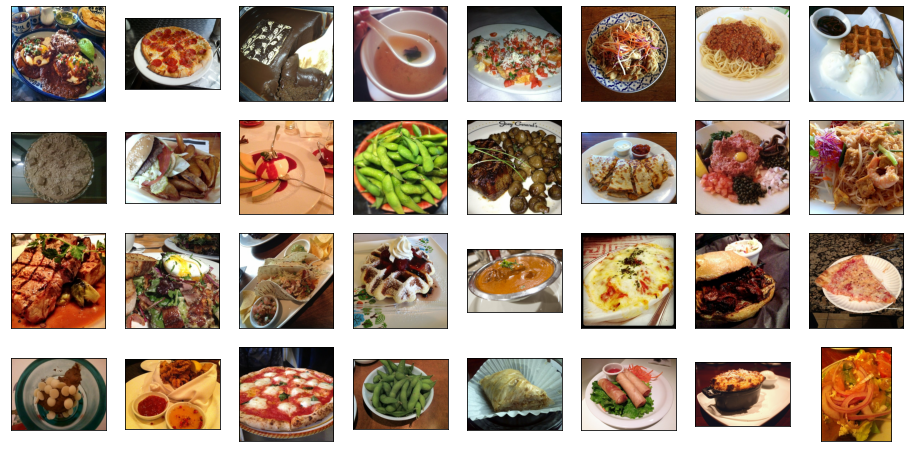

In [4]:
some_samples = [x[0] for x in iter(train_ds.take(32))]

fig = plt.figure(figsize=(16, 8))
for j in range(len(some_samples)):
    ax = fig.add_subplot(4, 8, j+1)
    ax.imshow(some_samples[j])
    plt.xticks([]), plt.yticks([])
plt.show()

In [23]:
class_names = ds_info.features['label'].names

Создание пайплайна данных

In [5]:
INP_SIZE = 160
NUM_EPOCHS = 10
BATCH_SIZE = 32

def prepare(img, label):
    img = tf.cast(img, tf.float32)/127. - 1.
    return tf.image.resize(img, (INP_SIZE, INP_SIZE)), label

train_ds = train_ds.shuffle(buffer_size=1000)
train_ds = train_ds.map(prepare)
train_ds = train_ds.batch(BATCH_SIZE, drop_remainder=True)

test_ds = test_ds.shuffle(buffer_size=1000)
test_ds = test_ds.map(prepare)
test_ds = test_ds.batch(128, drop_remainder=True)

Подготовка модели CNN

In [11]:
EXP_NAME = 'transfer'
base_model = tf.keras.applications.Xception(
  input_shape=(INP_SIZE, INP_SIZE, 3),
  include_top=False,
  weights='imagenet',
  )
base_model.trainable = True # Fine-tuning весов предобученной модели
# base_model.trainable = False # Заморозка весов предобученной модели

model = tf.keras.Sequential([
    base_model,
    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.Dense(101, activation='softmax'),
])

83697664/83683744 [==============================] - 2s 0us/step


Подготовка к обучению

In [14]:
LEARNING_RATE = 0.0001
optimizer = tf.keras.optimizers.Adam(learning_rate=LEARNING_RATE)

model.compile(optimizer=optimizer,
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

tensorboard_callback = tf.keras.callbacks.TensorBoard(
    log_dir='logs/'+EXP_NAME, 
    write_graph=False, update_freq=100, profile_batch=0)

Model Summary

In [15]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 xception (Functional)       (None, 5, 5, 2048)        20861480  
                                                                 
 global_average_pooling2d_1   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dense_1 (Dense)             (None, 101)               206949    
                                                                 
Total params: 21,068,429
Trainable params: 21,013,901
Non-trainable params: 54,528
_________________________________________________________________


Обучение модели

In [16]:
%%time

history = model.fit(
    train_ds,
    epochs=NUM_EPOCHS,
    validation_data=test_ds,
    callbacks=[tensorboard_callback])

Epoch 1/10
2130/2130 [==============================] - 1446s 674ms/step - loss: 2.1191 - accuracy: 0.4941 - val_loss: 1.3728 - val_accuracy: 0.6463
Epoch 2/10
2130/2130 [==============================] - 1448s 679ms/step - loss: 0.9480 - accuracy: 0.7518 - val_loss: 1.3162 - val_accuracy: 0.6717
Epoch 3/10
2130/2130 [==============================] - 1461s 685ms/step - loss: 0.4421 - accuracy: 0.8830 - val_loss: 1.4476 - val_accuracy: 0.6621
Epoch 4/10
2130/2130 [==============================] - 1468s 688ms/step - loss: 0.1992 - accuracy: 0.9475 - val_loss: 1.5802 - val_accuracy: 0.6622
Epoch 5/10
2130/2130 [==============================] - 1447s 678ms/step - loss: 0.1194 - accuracy: 0.9674 - val_loss: 1.6413 - val_accuracy: 0.6629
Epoch 6/10
2130/2130 [==============================] - 1446s 678ms/step - loss: 0.1024 - accuracy: 0.9693 - val_loss: 1.7337 - val_accuracy: 0.6613
Epoch 7/10
2130/2130 [==============================] - 1462s 685ms/step - loss: 0.0899 - accuracy: 0.9729

Оценка качества модели

In [17]:
%%time

model.evaluate(test_ds)

59/59 [==============================] - 35s 560ms/step - loss: 1.9630 - accuracy: 0.6613
CPU times: user 1min 2s, sys: 1.6 s, total: 1min 4s
Wall time: 41 s


[1.9630154371261597, 0.6612817645072937]

TensorBoard

In [18]:
%load_ext tensorboard
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

Запуск предсказания на нашем изображении

In [19]:
import random

idx = random.randint(0, 100)
image, label = next(iter(test_ds.take(idx)))

In [20]:
pred_prob = model(image, training=False).numpy()

pred_perc = np.max(pred_prob, axis=1) * 100
pred_label = np.argmax(pred_prob, axis=1)

In [21]:
image = (image + 1) * 255
image = tf.cast(image, tf.int64)


True Answer:: pancakes
Predictions: pancakes
Percent: 100.00%


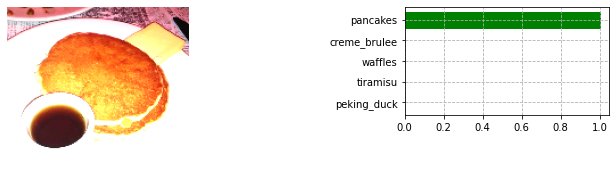


True Answer:: crab_cakes
Predictions: beef_tartare
Percent: 33.27%


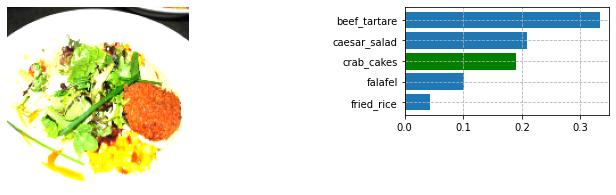


True Answer:: risotto
Predictions: apple_pie
Percent: 54.97%


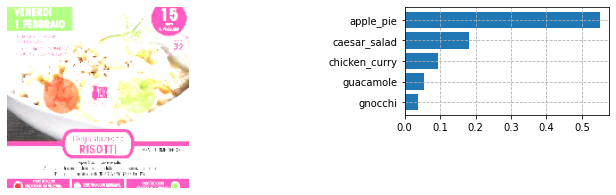


True Answer:: breakfast_burrito
Predictions: spring_rolls
Percent: 55.70%


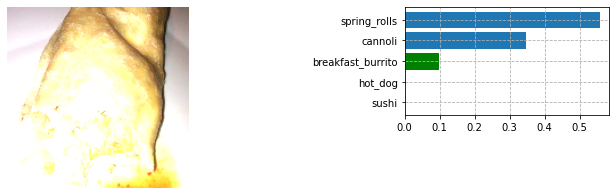


True Answer:: chicken_curry
Predictions: ravioli
Percent: 47.90%


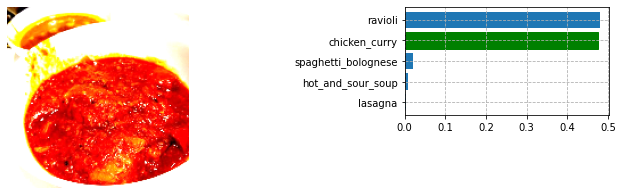

In [24]:
for i in range(5):
    true = class_names[label[i]]
    pred = class_names[pred_label[i]]
    print(f'\nTrue Answer:: {true}\n',
          f'Predictions: {pred}\n',
          f'Percent: {pred_perc[i]:.2f}%', sep ='')
    
    plt.figure(figsize=(11, 10))
    
    # image
    plt.subplot(3, 2, 1)
    plt.imshow(image[i])
    plt.axis('off')
    
    # accuracy
    plt.subplot(5, 2, 2)
    food_prob = zip(class_names, pred_prob[i])
    food_prob = sorted(food_prob, key=lambda fp: fp[1])[-5:]
    
    food = np.array(food_prob)[:, 0]
    prob = np.array(food_prob)[:, 1].astype(np.float32)
    
    bars = plt.barh(food, prob)

    plt.subplots_adjust(wspace=1, hspace=0)
    
    true_idx = np.where(food == true)[0]
    if true_idx.size:
        bars[true_idx[0]].set_color('g')

    plt.grid(True, linestyle='--')

    plt.show()